# Data Viusalization

## Importing and Cleaning data

Install any external packages

In [1]:
!pip install altair
!pip install vega_datasets

Import utilized packages

In [20]:
import numpy as np
import os
import pandas as pd
import altair as alt
import matplotlib.pyplot as plt
import seaborn as sns
from vega_datasets import data

Import and clean pre 2021 data

In [21]:
WHR_data = pd.read_csv('data/world-happiness-report.csv')
df = WHR_data.copy()

df = df.drop(columns = ['Positive affect','Negative affect'])
df

,Country name,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption
0,Afghanistan,2008,3.724,7.370,0.451,50.80,0.718,0.168,0.882
1,Afghanistan,2009,4.402,7.540,0.552,51.20,0.679,0.190,0.850
2,Afghanistan,2010,4.758,7.647,0.539,51.60,0.600,0.121,0.707
3,Afghanistan,2011,3.832,7.620,0.521,51.92,0.496,0.162,0.731
4,Afghanistan,2012,3.783,7.705,0.521,52.24,0.531,0.236,0.776
...,...,...,...,...,...,...,...,...,...
1944,Zimbabwe,2016,3.735,7.984,0.768,54.40,0.733,-0.095,0.724
1945,Zimbabwe,2017,3.638,8.016,0.754,55.00,0.753,-0.098,0.751
1946,Zimbabwe,2018,3.616,8.049,0.775,55.60,0.763,-0.068,0.844
1947,Zimbabwe,2019,2.694,7.950,0.759,56.20,0.632,-0.064,0.831


Import and clean 2021 data

In [22]:
recent_data = pd.read_csv('data/world-happiness-report-2021.csv')
df2 = recent_data.copy()
df2['year'] = 2021
df2 = df2.drop(columns = ['Standard error of ladder score','upperwhisker','lowerwhisker','Ladder score in Dystopia',
                          'Explained by: Log GDP per capita','Explained by: Social support','Explained by: Healthy life expectancy',
                          'Explained by: Freedom to make life choices','Explained by: Generosity','Explained by: Perceptions of corruption',
                          'Dystopia + residual'])
df2 = df2.rename(columns = {'Ladder score':'Life Ladder','Logged GDP per capita':'Log GDP per capita',
                            'Healthy life expectancy':'Healthy life expectancy at birth'})
df2

,Country name,Regional indicator,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,year
0,Finland,Western Europe,7.842,10.775,0.954,72.000,0.949,-0.098,0.186,2021
1,Denmark,Western Europe,7.620,10.933,0.954,72.700,0.946,0.030,0.179,2021
2,Switzerland,Western Europe,7.571,11.117,0.942,74.400,0.919,0.025,0.292,2021
3,Iceland,Western Europe,7.554,10.878,0.983,73.000,0.955,0.160,0.673,2021
4,Netherlands,Western Europe,7.464,10.932,0.942,72.400,0.913,0.175,0.338,2021
...,...,...,...,...,...,...,...,...,...,...
144,Lesotho,Sub-Saharan Africa,3.512,7.926,0.787,48.700,0.715,-0.131,0.915,2021
145,Botswana,Sub-Saharan Africa,3.467,9.782,0.784,59.269,0.824,-0.246,0.801,2021
146,Rwanda,Sub-Saharan Africa,3.415,7.676,0.552,61.400,0.897,0.061,0.167,2021
147,Zimbabwe,Sub-Saharan Africa,3.145,7.943,0.750,56.201,0.677,-0.047,0.821,2021


Added countries to Regions that were not present in 2021 data and added column to pre 2021 data with Region indicator

In [23]:
dic = {}
for i in df2['Regional indicator'].unique():
    dic[i]=list(df2[df2['Regional indicator'] ==i].groupby('Country name').size().index)
dic['Sub-Saharan Africa'].append('Angola')
dic['Latin America and Caribbean'].append('Belize')
dic['South Asia'].append('Bhutan')
dic['Sub-Saharan Africa'].append('Central African Republic')
dic['Sub-Saharan Africa'].append('Congo (Kinshasa)')
dic['Latin America and Caribbean'].append('Cuba')
dic['Sub-Saharan Africa'].append('Djibouti')
dic['Latin America and Caribbean'].append('Guyana')
dic['Middle East and North Africa'].append('Oman')
dic['Middle East and North Africa'].append('Qatar')
dic['Sub-Saharan Africa'].append('Somalia')
dic['Sub-Saharan Africa'].append('Somaliland region')
dic['Sub-Saharan Africa'].append('South Sudan')
dic['Middle East and North Africa'].append('Sudan')
dic['Latin America and Caribbean'].append('Suriname')
dic['Middle East and North Africa'].append('Syria')
dic['Latin America and Caribbean'].append('Trinidad and Tobago')

def find_region(x):
    '''Helper Function to Return Region Name based on the Country Name entered'''
    for reg in dic.keys():
        for c in dic[reg]:
            if x == c:
                return reg
df['Regional indicator'] = df['Country name'].apply(find_region)
df

,Country name,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Regional indicator
0,Afghanistan,2008,3.724,7.370,0.451,50.80,0.718,0.168,0.882,South Asia
1,Afghanistan,2009,4.402,7.540,0.552,51.20,0.679,0.190,0.850,South Asia
2,Afghanistan,2010,4.758,7.647,0.539,51.60,0.600,0.121,0.707,South Asia
3,Afghanistan,2011,3.832,7.620,0.521,51.92,0.496,0.162,0.731,South Asia
4,Afghanistan,2012,3.783,7.705,0.521,52.24,0.531,0.236,0.776,South Asia
...,...,...,...,...,...,...,...,...,...,...
1944,Zimbabwe,2016,3.735,7.984,0.768,54.40,0.733,-0.095,0.724,Sub-Saharan Africa
1945,Zimbabwe,2017,3.638,8.016,0.754,55.00,0.753,-0.098,0.751,Sub-Saharan Africa
1946,Zimbabwe,2018,3.616,8.049,0.775,55.60,0.763,-0.068,0.844,Sub-Saharan Africa
1947,Zimbabwe,2019,2.694,7.950,0.759,56.20,0.632,-0.064,0.831,Sub-Saharan Africa


Combines all data into one dataframe

In [24]:
cmbd_df = pd.concat([df,df2])
cmbd_df

,Country name,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Regional indicator
0,Afghanistan,2008,3.724,7.370,0.451,50.800,0.718,0.168,0.882,South Asia
1,Afghanistan,2009,4.402,7.540,0.552,51.200,0.679,0.190,0.850,South Asia
2,Afghanistan,2010,4.758,7.647,0.539,51.600,0.600,0.121,0.707,South Asia
3,Afghanistan,2011,3.832,7.620,0.521,51.920,0.496,0.162,0.731,South Asia
4,Afghanistan,2012,3.783,7.705,0.521,52.240,0.531,0.236,0.776,South Asia
...,...,...,...,...,...,...,...,...,...,...
144,Lesotho,2021,3.512,7.926,0.787,48.700,0.715,-0.131,0.915,Sub-Saharan Africa
145,Botswana,2021,3.467,9.782,0.784,59.269,0.824,-0.246,0.801,Sub-Saharan Africa
146,Rwanda,2021,3.415,7.676,0.552,61.400,0.897,0.061,0.167,Sub-Saharan Africa
147,Zimbabwe,2021,3.145,7.943,0.750,56.201,0.677,-0.047,0.821,Sub-Saharan Africa


## EDA of Data

Describes all data with basic statistics

This was used so we had a basic understanding of our quantitative variables

In [25]:
cmbd_df.describe()

,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption
count,2098.000000,2098.000000,2062.000000,2085.000000,2043.000000,2066.000000,2009.000000,1988.000000
mean,2013.768827,5.471402,9.373060,0.812709,63.478503,0.746094,-0.001027,0.745650
std,4.486449,1.112676,1.154247,0.118203,7.468780,0.140766,0.161400,0.186261
min,2005.000000,2.375000,6.635000,0.290000,32.300000,0.258000,-0.335000,0.035000
25%,2010.000000,4.652250,8.470500,0.750000,58.704500,0.652000,-0.115000,0.688750
50%,2014.000000,5.392000,9.462000,0.835000,65.280000,0.767000,-0.027000,0.801000
75%,2018.000000,6.282500,10.360750,0.905000,68.660000,0.859000,0.089000,0.869000
max,2021.000000,8.019000,11.648000,0.987000,77.100000,0.985000,0.698000,0.983000


Return Nulls per column

In [26]:
cmbd_df.isnull().sum(axis = 0)

Country name                          0
year                                  0
Life Ladder                           0
Log GDP per capita                   36
Social support                       13
Healthy life expectancy at birth     55
Freedom to make life choices         32
Generosity                           89
Perceptions of corruption           110
Regional indicator                    0
dtype: int64

Return Nulls per column of 2021 data

Was useful to find that no Null data came from 2021

In [27]:
df2.isnull().sum(axis = 0)

Country name                        0
Regional indicator                  0
Life Ladder                         0
Log GDP per capita                  0
Social support                      0
Healthy life expectancy at birth    0
Freedom to make life choices        0
Generosity                          0
Perceptions of corruption           0
year                                0
dtype: int64

Creates new DataFrame agregated by year and Regional indicator

In [28]:
ag_year = cmbd_df.groupby(['year','Regional indicator']).mean()
ag_year.reset_index(level=0,inplace=True)
ag_year.reset_index(level=0,inplace=True)
ag_year

,Regional indicator,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption
0,Central and Eastern Europe,2005,5.567250,10.001250,0.902250,65.475000,0.786000,NaN,0.936000
1,East Asia,2005,6.516000,10.529000,0.928000,73.200000,0.868000,NaN,0.699000
2,Latin America and Caribbean,2005,6.796000,9.513000,0.913667,64.966667,0.844667,NaN,0.743000
3,Middle East and North Africa,2005,5.676833,9.624667,0.836333,62.650000,0.698500,NaN,0.726600
4,North America and ANZ,2005,7.379500,10.655500,0.965000,71.350000,0.946000,0.256000,0.446500
...,...,...,...,...,...,...,...,...,...
162,North America and ANZ,2021,7.128500,10.809500,0.933500,72.325000,0.898750,0.120000,0.449250
163,South Asia,2021,4.441857,8.682571,0.703429,62.681000,0.765000,0.042714,0.797429
164,Southeast Asia,2021,5.407556,9.421444,0.820333,64.888444,0.909000,0.156333,0.709111
165,Sub-Saharan Africa,2021,4.494472,8.075194,0.696750,55.886472,0.723194,0.013444,0.765944


## Data Visualizations

### Life Ladder Score Exploration

For this project, I did my base analysis on the assumption that a country's Life Ladder Score, or the value from 0-10 that represents the worst to best possible life, is an accurate measure of a country's happiness. Given this assumption, I began our visualization based analysis by gauging the charts of average life ladder score by region, in order to look for if patterns are present in which parts of the world tend to have higher life ladder scores and which parts tend to have lower life ladder scores

Here I have some interesting finds intially, Sub-Saharan Africa and South Asia by far have the lowest average life ladder scores accross the board, while North America and ANZ and Western Europe have the highest average life ladder scores by relatively significant margins.  What I find very interesting is that the bottom two and the top two regions have very similar or identical scores from 2019 on.  

I decided to do some further visualizations on the Life Ladder Score to show the data from multiple perspectives


In [29]:
ag_region = alt.Chart(cmbd_df, title = 'Life Ladder by Region').mark_bar().encode(x = alt.X('Regional indicator:N', sort = '-y'),
    y= 'mean_score:Q', tooltip = ['Regional indicator','mean_score:Q']
    ).transform_aggregate(
    mean_score = 'mean(Life Ladder)', groupby=['Regional indicator'])
ag_region

alt.Chart(...)

In [30]:
ag_year = alt.Chart(cmbd_df).mark_line().encode(x = 'year:O',y='mean_score:Q').transform_aggregate(
    mean_score = 'mean(Life Ladder)', groupby=['year']).properties(title = 'Average global Life Ladder Score Over the Years')
ag_year

alt.Chart(...)

The graph above shows the average global life ladder score.  What stands out is that a large dip occured at 2006, and a noticeable dip occurred with the start of the pandemic

In [31]:
def graph_stat(x):
    region_select = alt.selection_multi(fields=['Regional indicator'] ,name="Select")

    make_selector = alt.Chart(cmbd_df,title = 'Select Region').mark_rect(
    ).encode(y='Regional indicator', color=alt.condition(region_select,
    'Regional indicator',alt.value('lightgray'))).add_selection(region_select)

    ag_year_and_region = alt.Chart(cmbd_df, title = x + ' by Region').mark_line().encode(x = 'year:O',y='mean:Q',
    color = alt.condition(region_select,'Regional indicator',
    alt.value('lightgray')), tooltip = ['Regional indicator','year']
    ).transform_aggregate(
    mean = 'mean(' + x + ')', groupby=['year','Regional indicator'])
    return make_selector | ag_year_and_region

In [32]:
alt.Chart(cmbd_df).mark_rect().encode(
    x='year:O',
    y='Regional indicator:N',
    color='mean_Life_Ladder:Q'
).transform_aggregate(
    mean_Life_Ladder = 'mean(Life Ladder)', groupby=['year','Regional indicator'])

alt.Chart(...)

In [33]:
graph_stat('Life Ladder')

alt.HConcatChart(...)

In [34]:
def clean_names(x):
    '''Helper Function to make sure all Country names are in the correct format'''
    if x == 'Bolivia (Plurinational State of)':
        return 'Bolivia'
    elif x == 'Congo':
        return 'Congo (Brazzaville)'
    elif x == 'Congo, Democratic Republic of the':
        return 'Congo (Kinshasa)'
    elif x == 'Czechia':
        return 'Czech Republic'
    elif x == 'Iran (Islamic Republic of)':
        return 'Iran'
    elif x == 'Moldova, Republic of':
        return 'Moldova'
    elif x == 'Russian Federation':
        return 'Russia'
    elif x == 'Korea, Republic of':
        return 'South Korea'
    elif x == 'Syrian Arab Republic':
        return 'Syria'
    elif x == 'Tanzania, United Republic of':
        return 'Tanzania'
    elif x == 'United Kingdom of Great Britain and Northern Ireland':
        return 'United Kingdom'
    elif x == 'USA':
        return 'United States'
    elif x == 'Venezuela (Bolivarian Republic of)':
        return 'Venezuela'
    elif x == 'Viet Nam':
        return 'Vietnam'
    elif x == "Côte d'Ivoire":
        return 'Ivory Coast'
    elif x == "Lao People's Democratic Republic":
        return 'Laos'
    elif x == 'Eswatini':
        return 'Swaziland'
    else:
        return x

Code to make DataFrames for Choropleth map

In [35]:
codes_df = pd.read_csv('data/country_codes.csv')
codes_df['name'] = codes_df['name'].apply(clean_names)
ag_countries = cmbd_df.groupby('Country name').mean()
ag_countries.reset_index(level=0,inplace=True)
ag_countries = ag_countries.join(codes_df.set_index('name'),how='outer',on='Country name')
no_nulls = ag_countries.fillna(0)

Segment of code used to help create "clean_names"

In [36]:
def find_name(x):
    '''Helper function to find the prescence of a substring'''
    cur = 'rit'
    return cur in x
codes_df[codes_df['name'].apply(find_name)]

,id,name,alpha2,alpha3
54,232,Eritrea,er,eri
109,478,Mauritania,mr,mrt
110,480,Mauritius,mu,mus


In [37]:
countries = alt.topo_feature(data.world_110m.url, 'countries')

colors = alt.Chart(countries,title = 'Life Ladder by Country'
    ).mark_geoshape().encode(color = 'Life Ladder:Q',
    tooltip = ['Country name:N','Life Ladder:Q']
    ).transform_lookup(lookup = 'id', 
    from_ = alt.LookupData(ag_countries,'id',['Country name','Life Ladder'])
    ).properties(width=500,height=300)

gray = alt.Chart(countries
    ).mark_geoshape(fill='gray').encode(color = 'Life Ladder:Q',
    ).transform_lookup(lookup = 'id', 
    from_ = alt.LookupData(no_nulls,'id',['Country name','Life Ladder'])
    ).properties(width=500,height=300)

gray + colors

alt.LayerChart(...)

### Comparing Life Ladder Score with other Features

After looking at global life ladder scores from around the globe through several perspectives, I decided to investigate what features correlate strongly to both a high and low life ladder, and to see if there are features which have minimal effect on life ladder score

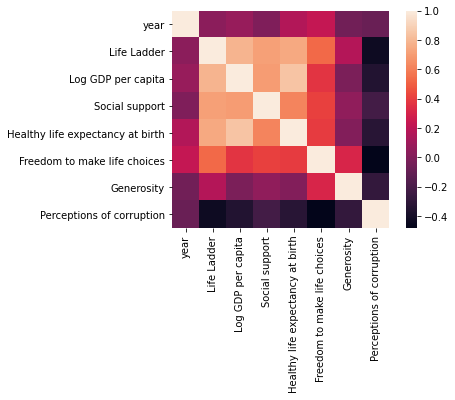

In [38]:
corrmat = cmbd_df.corr()
f, ax = plt.subplots()
sns.heatmap(corrmat, square=True)

/opt/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/opt/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


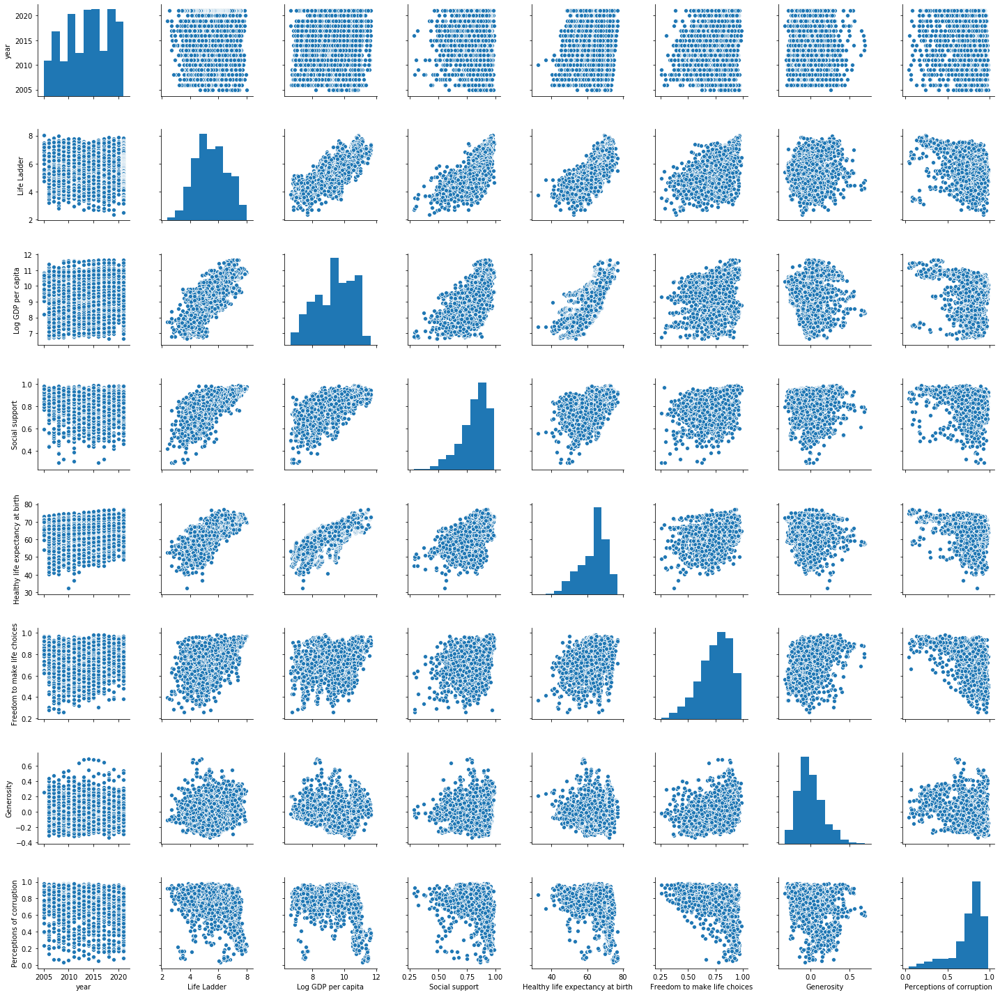

In [137]:
sns.pairplot(cmbd_df)

Graph GDP over time by Region

Social Support over time by Region

In [239]:
graph_stat('Social support')

alt.HConcatChart(...)

Life Expectancy over time by Region

In [139]:
graph_stat('Healthy life expectancy at birth')

alt.HConcatChart(...)

Freedom over time by Region

In [140]:
graph_stat('Freedom to make life choices')

alt.HConcatChart(...)

Generosity over time by Region

In [141]:
graph_stat('Generosity')

alt.HConcatChart(...)

Graph Corruption over time by Region

In [142]:
graph_stat('Perceptions of corruption')

alt.HConcatChart(...)

Now that we've looked at regional trends, let's focus on a few specific regions to try to understand what influences life ladder, and if there are different variables at play in different cultural regions

In [143]:
alt.Chart(cmbd_df[cmbd_df['Regional indicator'] == 'North America and ANZ']).mark_point().encode(
    x = 'year:O',y='Life Ladder:Q',color = 'Country name')

alt.Chart(...)

In [144]:
alt.Chart(cmbd_df[cmbd_df['Regional indicator'] == 'East Asia']).mark_point().encode(
    x = 'year:O',y='Life Ladder:Q',color = 'Country name')

alt.Chart(...)

### Explore Relationship between GDP and Life Ladder

One of my main goals was to better understand the role that wealth plays in a countries happiness level, and so therefore the following sections will dive deep into the role, if any, that gdp plays in influencing the life ladder score

In [145]:
graph_stat('Log GDP per capita')

alt.HConcatChart(...)

Very Long graph, but a good visual of Life Ladder vs. GDP. Life Ladder and GDP appear to have a posative relationship but it is far from a direct correlation. 

In [229]:
alt.Chart(cmbd_df, title = 'Life Ladder vs. GDP').mark_circle(size = 100).encode(x = alt.X('Log GDP per capita:N',
        axis = alt.Axis(values=list(range(6,12)))),
        y = 'Life Ladder:Q').properties(width = 800, height = 500)

alt.Chart(...)

When Aggregated by country, the relationship between Life Ladder and GDP becomes much more defined as a posative correlation

In [230]:
alt.Chart(cmbd_df, title =  'Life Ladder vs. GDP Aggregated by Country').mark_circle(size = 200).encode(
    x = alt.X('mean_GDP:N', axis = alt.Axis(values=list(range(6,12)))),y = 'mean_score:Q',
    color = 'Regional indicator:N', tooltip = ['Country name','Regional indicator']
    ).transform_aggregate(mean_score = 'mean(Life Ladder)', mean_GDP = 'mean(Log GDP per capita)', 
    groupby=['Country name','Regional indicator']).properties(width = 700, height = 500)

alt.Chart(...)

Here is code to make a cleaned visual of Log GDP vs. Life Ladder with a line of best fit and the color of the points as encoded by region.

In [39]:
temp_df = cmbd_df.groupby('Country name').mean()[['Life Ladder','Log GDP per capita']]
tdf = temp_df[temp_df['Log GDP per capita'] == temp_df['Log GDP per capita']]
tdd = cmbd_df[['Country name','Regional indicator']]
temp = tdf.merge(tdd,how = 'left',on = 'Country name')
groups = temp.groupby('Country name')
new_data = []
for key,group in groups:
    new_data.append(group.iloc[0])
final = pd.DataFrame(new_data)

chart = alt.Chart(final, title = 'Life Ladder vs. GDP').mark_circle(size = 400).encode(
        x = alt.X('Log GDP per capita', scale=alt.Scale(domain=[6.8, 12])),
        y = alt.Y('Life Ladder', scale=alt.Scale(domain=[3, 8])),
    color = 'Regional indicator').properties(width = 1200, height = 750)
(chart + chart.transform_regression('Log GDP per capita', 'Life Ladder').mark_line()).configure_axis(
    labelFontSize=20,
    titleFontSize=26).configure_title(fontSize=35).configure_legend(labelFontSize=12,titleFontSize=20)

alt.LayerChart(...)

Now that I've done some overall analysis worldwide and regional on the trends gdp has on life ladder score, I must focus on the poorest and richest 5 nations to make solid conclusions on if gdp does play a decisive factor in influencing life ladder score 

In [183]:
specific_cmbd_df = cmbd_df.loc[cmbd_df['Log GDP per capita'] >0]
#remove rows where no gdp was recorded so as to avoid skewing our data
average_scores_per_country = specific_cmbd_df.groupby('Country name').mean()
average_scores_per_country = average_scores_per_country.sort_values(by='Log GDP per capita')
average_scores_per_country

,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption
Country name,,,,,,,,
Burundi,2013.500000,3.586000,6.707833,0.429833,51.330000,0.480000,-0.034500,0.711500
Congo (Kinshasa),2013.375000,4.348375,6.884125,0.775000,51.355000,0.586875,-0.008125,0.845500
Malawi,2013.692308,4.019769,6.889615,0.565462,53.416000,0.789769,0.096077,0.772692
Central African Republic,2012.200000,3.515000,6.961000,0.402400,43.356000,0.680400,0.027000,0.842000
Niger,2013.066667,4.308867,6.992867,0.687400,50.732000,0.749933,-0.022267,0.684000
...,...,...,...,...,...,...,...,...
Ireland,2013.933333,7.068867,11.083333,0.959133,71.768000,0.891600,0.229267,0.458933
Switzerland,2015.181818,7.550364,11.097364,0.943455,73.430909,0.924182,0.099000,0.304636
Singapore,2013.142857,6.495143,11.340357,0.883214,75.472357,0.849214,0.062571,0.096615


In [194]:
poorest_countries = average_scores_per_country.head(5)
richest_countries = average_scores_per_country.tail(5)
poorest_and_richest = pd.concat([poorest_countries,richest_countries])
wealth_indicator = []
for i in poorest_and_richest['Log GDP per capita']:
    if i <10:
        wealth_indicator.append(0)
    else:
        wealth_indicator.append(1)
poorest_and_richest['Wealth Indicator'] = wealth_indicator
poorest_and_richest['country name']= poorest_and_richest.index
poorest_and_richest

,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Wealth Indicator,country name
Country name,,,,,,,,,,
Burundi,2013.500000,3.586000,6.707833,0.429833,51.330000,0.480000,-0.034500,0.711500,0,Burundi
Congo (Kinshasa),2013.375000,4.348375,6.884125,0.775000,51.355000,0.586875,-0.008125,0.845500,0,Congo (Kinshasa)
Malawi,2013.692308,4.019769,6.889615,0.565462,53.416000,0.789769,0.096077,0.772692,0,Malawi
Central African Republic,2012.200000,3.515000,6.961000,0.402400,43.356000,0.680400,0.027000,0.842000,0,Central African Republic
Niger,2013.066667,4.308867,6.992867,0.687400,50.732000,0.749933,-0.022267,0.684000,0,Niger
Ireland,2013.933333,7.068867,11.083333,0.959133,71.768000,0.891600,0.229267,0.458933,1,Ireland
Switzerland,2015.181818,7.550364,11.097364,0.943455,73.430909,0.924182,0.099000,0.304636,1,Switzerland
Singapore,2013.142857,6.495143,11.340357,0.883214,75.472357,0.849214,0.062571,0.096615,1,Singapore
Qatar,2011.400000,6.569200,11.507600,0.863000,67.188000,0.898000,0.128250,0.184000,1,Qatar


In [206]:
alt.Chart(poorest_and_richest).mark_bar().encode(
    x = alt.X('country name:N', sort = 'y'),
    y='Life Ladder',
    color = 'Wealth Indicator',
    tooltip = ['country name:N','Life Ladder:Q']
)

alt.Chart(...)

Significant differences are present in life ladder score between the wealthy and the poor nations, the lowest wealthy nation is 2 full ladder steps above the highest poor nation.

In [207]:
alt.Chart(poorest_and_richest).mark_point().encode(
    x = 'Log GDP per capita:Q',
    y='Life Ladder:Q',
    color = 'Wealth Indicator',
    tooltip = ['country name:N','Life Ladder:Q','Log GDP per capita:Q' ])

alt.Chart(...)

Very strong clustering is present betweeen the wealthy and poor subsets, gdp can be assumed to play a decisive role in predicting whether a nation will have a high life ladder score

After analyzing the dependency life ladder has on log gdp per capita, I decided to see if the results seen above will be replicated when the variable axises are switched, and the nations chosen are instead the 5 happiest and least happy nations

In [195]:
sorted_by_happiness =  average_scores_per_country.sort_values(by='Life Ladder')
least_happy_countries = sorted_by_happiness.head(5)
happiest_countries = sorted_by_happiness.tail(5)
happy_and_sad = pd.concat([least_happy_countries,happiest_countries])
happiness_indicator = []
for i in happy_and_sad['Life Ladder']:
    if i <7:
        happiness_indicator.append(0)
    else:
        happiness_indicator.append(1)
happy_and_sad['Happiness Indicator'] = happiness_indicator
happy_and_sad['country name']= happy_and_sad.index
happy_and_sad

,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Happiness Indicator,country name
Country name,,,,,,,,,,
Afghanistan,2014.076923,3.512231,7.654231,0.504923,52.284077,0.507692,0.056846,0.849538,0,Afghanistan
Central African Republic,2012.200000,3.515000,6.961000,0.402400,43.356000,0.680400,0.027000,0.842000,0,Central African Republic
Burundi,2013.500000,3.586000,6.707833,0.429833,51.330000,0.480000,-0.034500,0.711500,0,Burundi
Togo,2014.500000,3.610200,7.251500,0.467300,53.045400,0.622900,-0.024500,0.800100,0,Togo
Rwanda,2013.769231,3.636000,7.468385,0.614231,57.880000,0.870154,0.016417,0.184538,0,Rwanda
Netherlands,2013.733333,7.466133,10.889800,0.934067,71.753333,0.907800,0.269143,0.409800,1,Netherlands
Norway,2015.090909,7.501455,11.040364,0.950818,72.727273,0.954909,0.132182,0.337455,1,Norway
Switzerland,2015.181818,7.550364,11.097364,0.943455,73.430909,0.924182,0.099000,0.304636,1,Switzerland
Finland,2014.285714,7.614643,10.751714,0.949357,71.238571,0.940357,-0.004143,0.244500,1,Finland


In [209]:
alt.Chart(happy_and_sad).mark_bar().encode(
    x = alt.X('country name:N', sort = 'y'),
    y='Log GDP per capita',
    color = 'Happiness Indicator',
    tooltip = ['country name:N','Log GDP per capita:Q']
)

alt.Chart(...)

The results hear show even more significant differneces than the previous bar chart, it appears that they are interchangeable with each other, and that life ladder/gdp are powerful indicators of the other

In [208]:
alt.Chart(happy_and_sad).mark_point().encode(
    x = 'Life Ladder:Q',
    y='Log GDP per capita:Q',
    color = 'Happiness Indicator',
    tooltip = ['country name:N','Life Ladder:Q','Log GDP per capita:Q' ])

alt.Chart(...)

The clustering present with log gdp as the dependent variable is even stronger than the reverse, I can decisively conclude that gdp and life ladder are hihgly effective features in predicting one another, and therfore share a strong relationship.   

In [242]:
poorest_countries.describe()

,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption
count,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000
mean,2013.166795,3.955602,6.887088,0.572019,50.037800,0.657396,0.011637,0.771138
std,0.586357,0.391765,0.110453,0.160892,3.871221,0.125556,0.052523,0.073660
min,2012.200000,3.515000,6.707833,0.402400,43.356000,0.480000,-0.034500,0.684000
25%,2013.066667,3.586000,6.884125,0.429833,50.732000,0.586875,-0.022267,0.711500
50%,2013.375000,4.019769,6.889615,0.565462,51.330000,0.680400,-0.008125,0.772692
75%,2013.500000,4.308867,6.961000,0.687400,51.355000,0.749933,0.027000,0.842000
max,2013.692308,4.348375,6.992867,0.775000,53.416000,0.789769,0.096077,0.845500


In [243]:
richest_countries.describe()

,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption
count,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000
mean,2013.648268,6.950765,11.327814,0.913644,72.027520,0.894133,0.111384,0.284420
std,1.467782,0.430385,0.237288,0.040256,3.057271,0.027952,0.074375,0.145739
min,2011.400000,6.495143,11.083333,0.863000,67.188000,0.849214,0.037833,0.096615
25%,2013.142857,6.569200,11.097364,0.883214,71.768000,0.891600,0.062571,0.184000
50%,2013.933333,7.068867,11.340357,0.919417,72.278333,0.898000,0.099000,0.304636
75%,2014.583333,7.070250,11.507600,0.943455,73.430909,0.907667,0.128250,0.377917
max,2015.181818,7.550364,11.610417,0.959133,75.472357,0.924182,0.229267,0.458933


In [240]:
least_happy_countries.describe()

,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption
count,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000
mean,2013.609231,3.571886,7.208590,0.483737,51.579095,0.632229,0.008253,0.677535
std,0.871159,0.056064,0.380785,0.082567,5.244754,0.156284,0.037683,0.281005
min,2012.200000,3.512231,6.707833,0.402400,43.356000,0.480000,-0.034500,0.184538
25%,2013.500000,3.515000,6.961000,0.429833,51.330000,0.507692,-0.024500,0.711500
50%,2013.769231,3.586000,7.251500,0.467300,52.284077,0.622900,0.016417,0.800100
75%,2014.076923,3.610200,7.468385,0.504923,53.045400,0.680400,0.027000,0.842000
max,2014.500000,3.636000,7.654231,0.614231,57.880000,0.870154,0.056846,0.849538


In [241]:
happiest_countries.describe()

,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption
count,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000
mean,2014.345855,7.561844,10.932361,0.946927,72.083017,0.934475,0.131543,0.299103
std,0.783876,0.085002,0.137673,0.008642,0.964729,0.018595,0.099125,0.081750
min,2013.437500,7.466133,10.751714,0.934067,71.238571,0.907800,-0.004143,0.199125
25%,2013.733333,7.501455,10.882562,0.943455,71.265000,0.924182,0.099000,0.244500
50%,2014.285714,7.550364,10.889800,0.949357,71.753333,0.940357,0.132182,0.304636
75%,2015.090909,7.614643,11.040364,0.950818,72.727273,0.945125,0.161533,0.337455
max,2015.181818,7.676625,11.097364,0.956938,73.430909,0.954909,0.269143,0.409800
